# Przetwarzanie wstępne. Filtracja kontekstowa.


### Cel:
- zapoznanie z pojęciem kontekstu / filtracji kontekstowej,
- zapoznanie z pojęciem konwolucji (splotu),
- zapoznanie z wybranymi filtrami:
	- filtry liniowe dolnoprzepustowe:
		- filtr uśredniający,
		- filtr Gaussa.
	- filtry nielinowe:
		- mediana,
		- mediana dla obrazów kolorowych.
	- filtry liniowe górnoprzepustowe:
			- laplasjan,
			- operator Robersta, Prewitta, Sobela.
- zadanie domowe: adaptacyjna filtracja medianowa.

### Filtry liniowe uśredniające (dolnoprzepustowe)

Jest to podstawowa rodzina filtrów stosowana w cyfrowym przetwarzaniu obrazów. 
Wykorzystuje się je w celu "rozmazania" obrazu i tym samym redukcji szumów (zakłóceń) na obrazie.
Filtr określony jest przez dwa parametry: rozmiar maski (ang. _kernel_) oraz wartości współczynników maski.

Warto zwrócić uwagę, że omawiane w niniejszym rozdziale operacje generują nową wartość piksela na podstawie pewnego fragmentu obrazu (tj. kontekstu), a nie jak operacje punktowe tylko na podstawie jednego piksela.


1. Wczytaj obraz _plansza.png_.
W dalszej części ćwiczenia sprawdzenie działania filtracji dla innych obrazów sprowadzi się do wczytania innego pliku.

2. Podstawowa funkcja to `cv2.filter2D`  - realizacja filtracji konwolucyjnej.
   Proszę sprawdzić jej dokumentację i zwrócić uwagę na obsługę problemu brzegowego (na krawędziach istnieją piksele dla których nie da się wyznaczyć otoczenia).

  Uwaga. Problem ten można też rozwiązać z użyciem funkcji `signal.convolve2d` z biblioteki _scipy_ (`from scipy import signal`).

3. Stwórz podstawowy filtr uśredniający o rozmiarze $3 \times 3$ -- za pomocą funkcji `np.ones`. Wykonaj konwolucję na wczytanym obrazie. Na wspólnym rysunku wyświetl obraz oryginalny, po filtracji oraz moduł z różnicy.

4. Przeanalizuj otrzymane wyniki. Jakie elementy zawiera obraz "moduł z różnicy"? Co na tej podstawie można powiedzieć o filtracji dolnoprzepustowej?

In [1]:
import cv2
import os
import requests
from matplotlib import pyplot as plt
import numpy as np
from scipy import signal

In [2]:
url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/06_Context/'

fileNames = ["jet.png", "kw.png", "moon.png", "lenaSzum.png", "lena.png", "plansza.png"]
for fileName in fileNames:
  if not os.path.exists(fileName):
      r = requests.get(url + fileName, allow_redirects=True)
      open(fileName, 'wb').write(r.content)



5. Na wspólnym rysunku wyświetl wyniki filtracji uśredniającej z oknem o rozmiarze 3, 5, 9, 15 i 35. 
Wykorzystaj polecenie `plt.subplot`. 
Przeanalizuj wpływ rozmiaru maski na wynik. 

In [3]:
def imshow(img, color_map="gray"):
    plt.imshow(img, cmap=color_map)
    plt.xticks([])
    plt.yticks([])
    plt.axis("off")
    plt.show()

In [4]:
def imshow_subplt(imgs, rows, cols, figsize=(15, 10), color_map="gray"):
    assert rows > 0 and cols > 0
    f, ax = plt.subplots(rows, cols)
    f.set_size_inches(figsize)
    ind = 0
    if rows == 1:
        for col in range(cols):
            ax[col].imshow(imgs[ind], cmap=color_map)
            ax[col].set_xticks([])
            ax[col].set_yticks([])
            ax[col].axis("off")
            ind += 1
    elif cols == 1:
        for row in range(rows):
            ax[row].imshow(imgs[ind], cmap=color_map)
            ax[row].set_xticks([])
            ax[row].set_yticks([])
            ax[row].axis("off")
            ind += 1
    else:
        for row in range(rows):
            for col in range(cols):
                ax[row, col].imshow(imgs[ind], cmap=color_map)
                ax[row, col].set_xticks([])
                ax[row, col].set_yticks([])
                ax[row, col].axis("off")
                ind += 1
    plt.show()

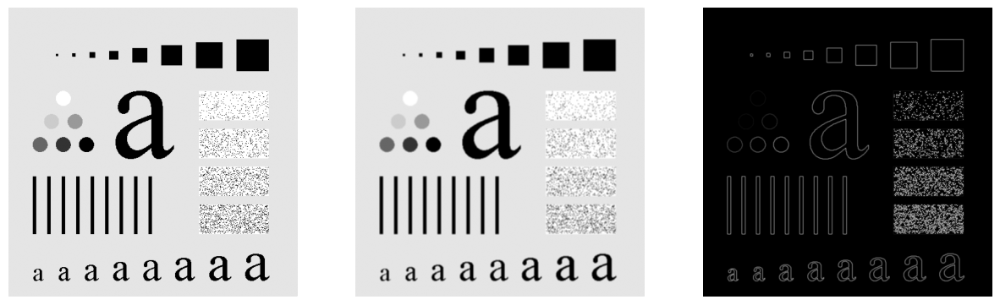

In [5]:
img = cv2.imread("plansza.png", cv2.IMREAD_GRAYSCALE)
kernel3 = np.ones((3,3)) / 9
img3 = cv2.filter2D(img, -1, kernel3)
diff = np.abs(img3.astype(np.int16) - img.astype(np.int16)).astype(np.uint8)
imshow_subplt([img, img3, diff], 1, 3)

In [6]:
kernel5 = np.ones((5,5)) / 25
kernel9 = np.ones((9,9)) / (9*9)
kernel15 = np.ones((15,15)) / (15*15)
kernel35 = np.ones((35,35)) / (35*35)

img5 = cv2.filter2D(img, -1, kernel5)
img9 = cv2.filter2D(img, -1, kernel9)
img15 = cv2.filter2D(img, -1, kernel15)
img35 = cv2.filter2D(img, -1, kernel35)

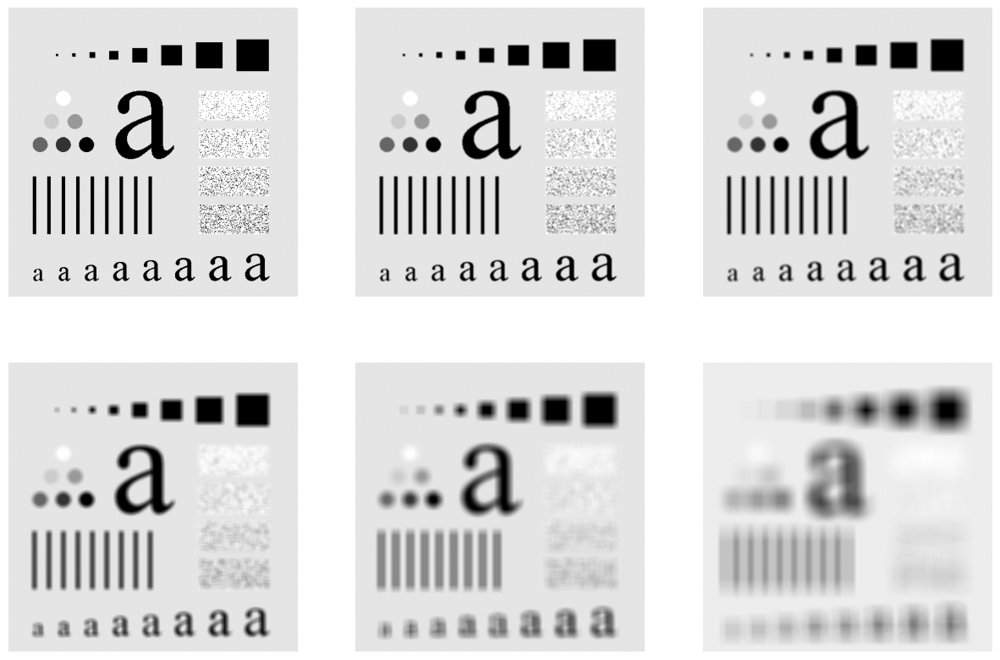

In [7]:
imshow_subplt((img, img3, img5, img9, img15, img35), 2, 3)

6. Wczytaj obraz _lena.png_.
Zaobserwuj efekty filtracji dolnoprzepustowej dla obrazu rzeczywistego.

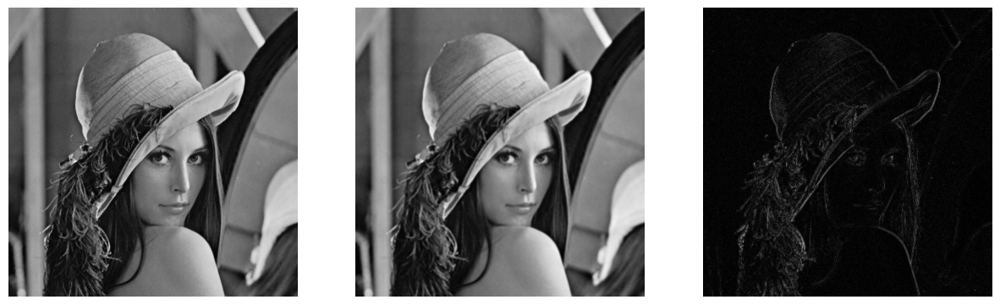

In [8]:
lena = cv2.imread("lena.png", cv2.IMREAD_GRAYSCALE)
lena3 = cv2.filter2D(lena, -1, kernel3)
diff = np.abs(lena.astype(np.int16) - lena3.astype(np.int16)).astype(np.uint8)
imshow_subplt((lena, lena3, diff), 1, 3)

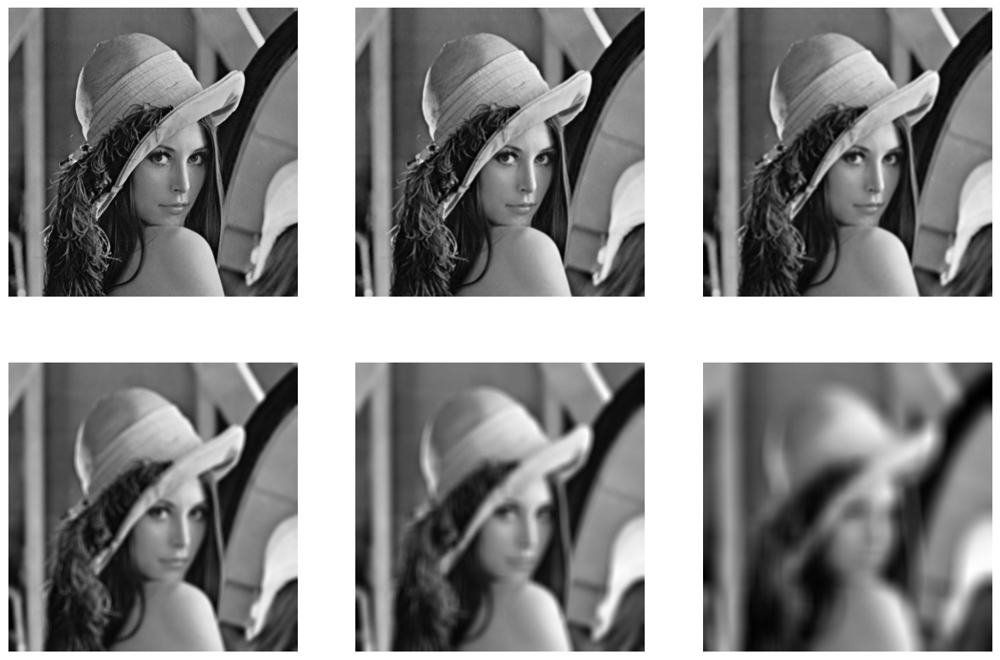

In [9]:
lena5 = cv2.filter2D(lena, -1, kernel5)
lena9 = cv2.filter2D(lena, -1, kernel9)
lena15 = cv2.filter2D(lena, -1, kernel15)
lena35 = cv2.filter2D(lena, -1, kernel35)

imshow_subplt((lena, lena3, lena5, lena9, lena15, lena35), 2, 3)

7. Niekorzystny efekt towarzyszący wykonanym filtracjom dolnoprzepustowym to utrata ostrości. 
Częściowo można go zniwelować poprzez odpowiedni dobór maski. 
Wykorzystaj maskę:  `M = np.array([1 2 1; 2 4 2; 1 2 1])`. 
Przed obliczeniami należy jeszcze wykonać normalizację - podzielić każdy element maski przez sumę wszystkich elementów: `M = M/sum(sum(M));`.
Tak przygotowaną maskę wykorzystaj w konwolucji - wyświetl wyniki tak jak wcześniej.
Możliwe jest też wykorzystywanie innych masek - współczynniki można dopasowywać do konkretnego problemu.

In [10]:
kernel = np.array(
    [
        [1,2,1],
        [2,4,2],
        [1,2,1]
    ]
)
kernel = kernel / np.sum(kernel)

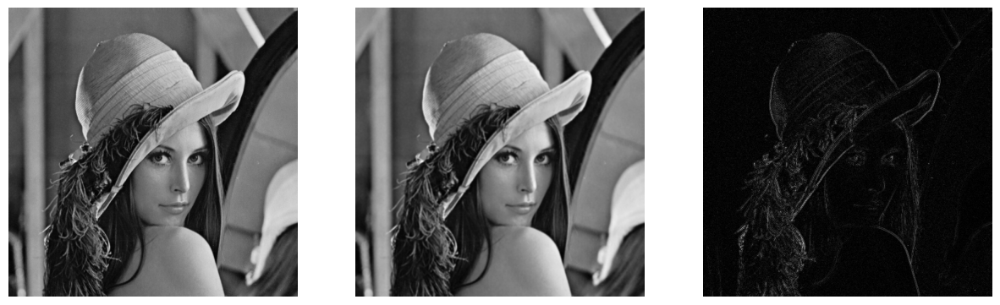

In [11]:
lena_filtered = cv2.filter2D(lena, -1, kernel)
diff = np.abs(lena.astype(np.int16) - lena_filtered.astype(np.int16)).astype(np.uint8)
imshow_subplt((lena, lena_filtered, diff), 1, 3)

8. Skuteczną i często wykorzystywaną maską jest tzw. maska Gasussa.
Jest to zbiór liczb, które aproksymują dwuwymiarowy rozkład Gaussa. 
Parametrem jest odchylenie standardowe i rozmiar maski.

9. Wykorzystując przygotowaną funkcję `fgaussian` stwórz maskę o rozmiarze $5 \times 5$ i odchyleniu standardowym 0.5.
  Wykorzystując funkcję `mesh` zwizualizuj filtr.
  Sprawdź jak parametr ``odchylenie standardowe'' wpływa na ``kształt'' filtru.

  Uwaga. W OpenCV dostępna jest *dedykowana* funkcja do filtracji Gaussa - `GaussianBlur`.
  Proszę na jednym przykładzie porównać jej działanie z użytym wyżej rozwiązaniem.

10. Wykonaj filtrację dla wybranych (2--3) wartości odchylenia standardowego.


In [12]:
def fgaussian(size, sigma):
     m = n = size
     h, k = m//2, n//2
     x, y = np.mgrid[-h:h+1, -k:k+1]
     g = np.exp(-(x**2 + y**2)/(2*sigma**2))
     return g /g.sum() 
    
    
def mesh(fun, size):
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    

    X = np.arange(-size//2, size//2, 1)
    Y = np.arange(-size//2, size//2, 1)
    X, Y = np.meshgrid(X, Y)
    Z = fun
    
    ax.plot_surface(X, Y, Z)
    
    plt.show()
    



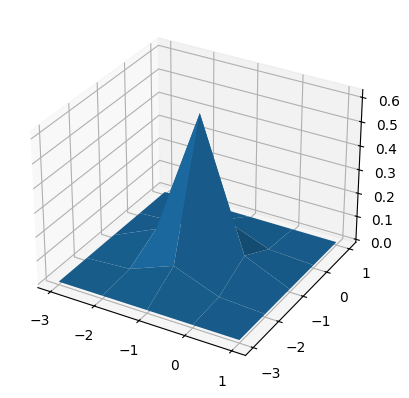

In [13]:
kernel_gauss = fgaussian(5, 0.5)
mesh(kernel_gauss, 5)

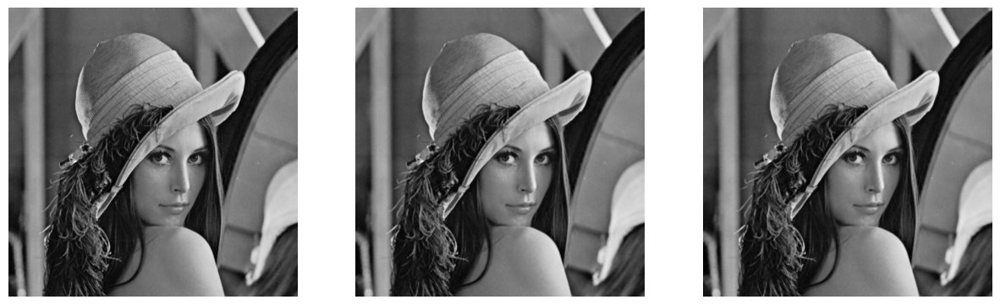

In [14]:
lena_own_gauss = cv2.filter2D(lena, -1, kernel_gauss)
lena_built_in_gauss = cv2.GaussianBlur(lena, (5,5), 0.5)
imshow_subplt((lena, lena_own_gauss, lena_built_in_gauss), 1, 3)

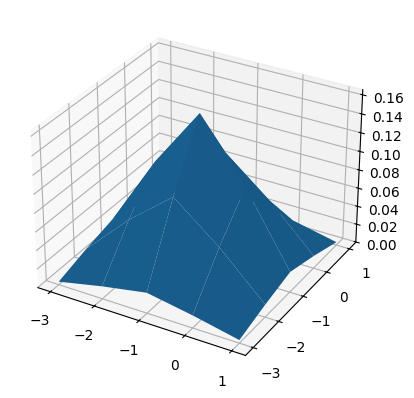

In [15]:
kernel_gauss = fgaussian(5, 1)
mesh(kernel_gauss, 5)

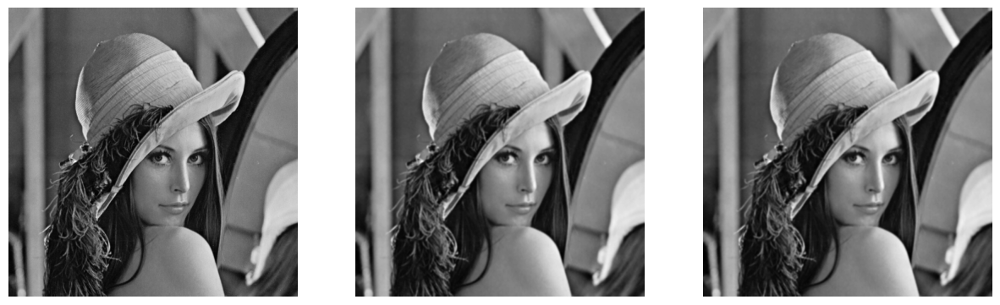

In [16]:
lena_own_gauss = cv2.filter2D(lena, -1, kernel_gauss)
lena_built_in_gauss = cv2.GaussianBlur(lena, (5,5), 1)
imshow_subplt((lena, lena_own_gauss, lena_built_in_gauss), 1, 3)

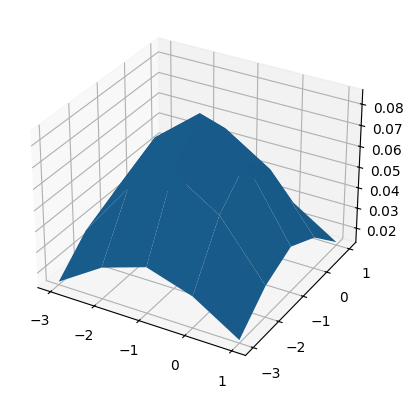

In [17]:
kernel_gauss = fgaussian(5, 1.5)
mesh(kernel_gauss, 5)

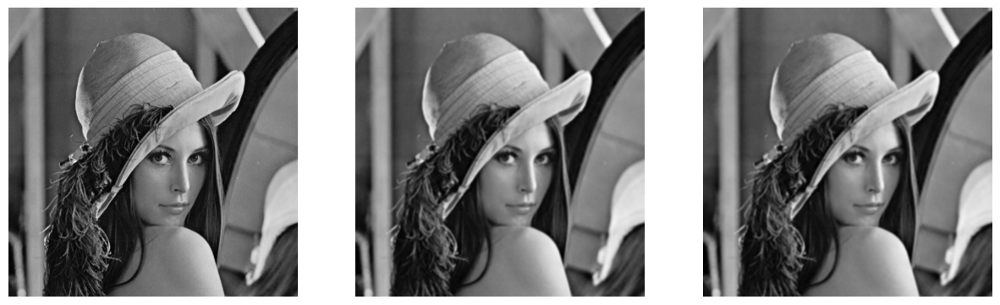

In [18]:
lena_own_gauss = cv2.filter2D(lena, -1, kernel_gauss)
lena_built_in_gauss = cv2.GaussianBlur(lena, (5,5), 1.5)
imshow_subplt((lena, lena_own_gauss, lena_built_in_gauss), 1, 3)

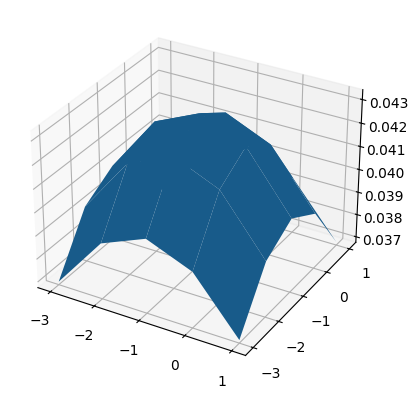

In [19]:
kernel_gauss = fgaussian(5, 5)
mesh(kernel_gauss, 5)

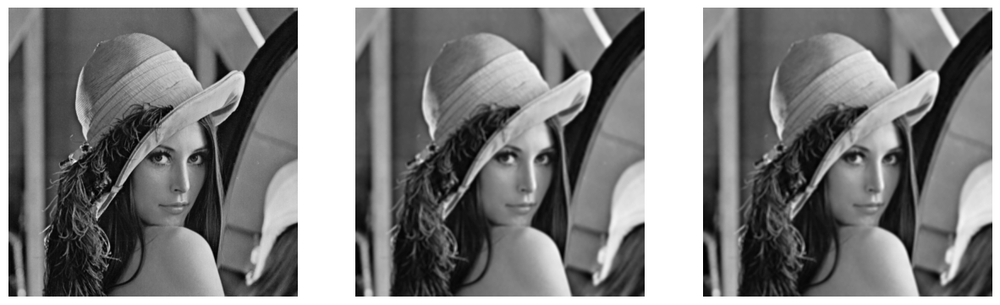

In [20]:
lena_own_gauss = cv2.filter2D(lena, -1, kernel_gauss)
lena_built_in_gauss = cv2.GaussianBlur(lena, (5,5), 5)
imshow_subplt((lena, lena_own_gauss, lena_built_in_gauss), 1, 3)

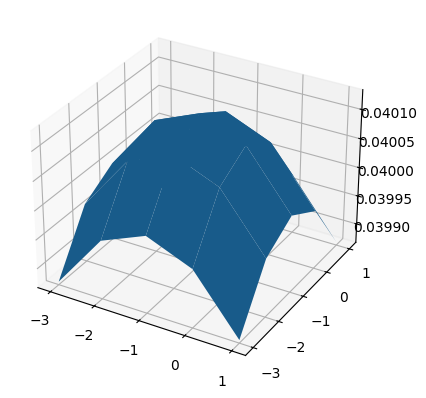

In [21]:
kernel_gauss = fgaussian(5, 25)
mesh(kernel_gauss, 5)

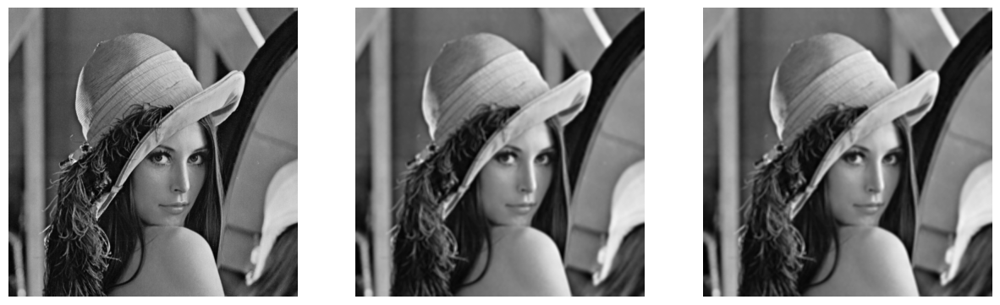

In [22]:
lena_own_gauss = cv2.filter2D(lena, -1, kernel_gauss)
lena_built_in_gauss = cv2.GaussianBlur(lena, (5,5), 25)
imshow_subplt((lena, lena_own_gauss, lena_built_in_gauss), 1, 3)

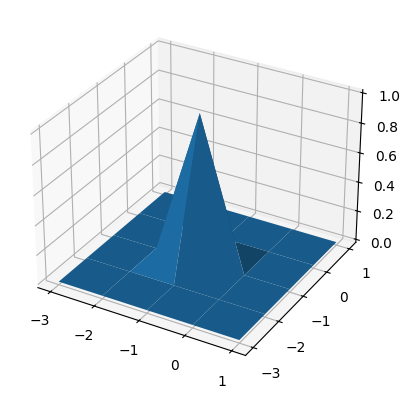

In [23]:
kernel_gauss = fgaussian(5, 0.001)
mesh(kernel_gauss, 5)

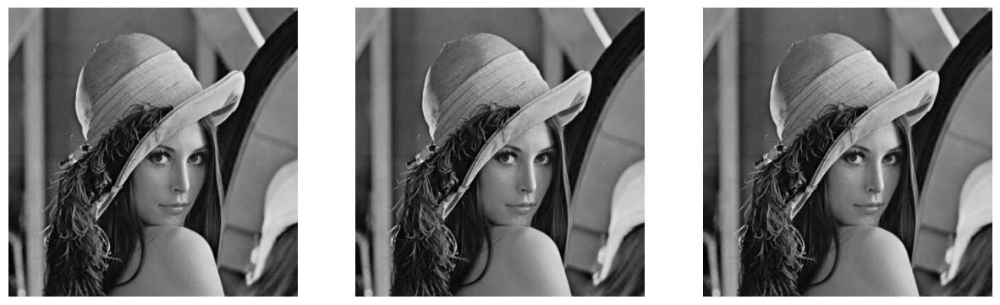

In [24]:
lena_own_gauss = cv2.filter2D(lena, -1, kernel_gauss)
lena_built_in_gauss = cv2.GaussianBlur(lena, (5,5), 0.001)
imshow_subplt((lena, lena_own_gauss, lena_built_in_gauss), 1, 3)

### Filtry nieliniowe -- mediana

Filtry rozmywające redukują szum, ale niekorzystnie wpływają na ostrość obrazu.
Dlatego często wykorzystuje się filtry nieliniowe - np. filtr medianowy (dla przypomnienia: mediana - środkowa wartość w posortowanym ciągu liczb).

Podstawowa różnica pomiędzy filtrami liniowymi, a nieliniowymi polega na tym, że przy filtracji liniowej na nową wartość piksela ma wpływ wartość wszystkich pikseli z otoczenia (np. uśrednianie, czasem ważone), natomiast w przypadku filtracji nieliniowej jako nowy piksel wybierana jest któraś z wartości otoczenia - według jakiegoś wskaźnika (wartość największa, najmniejsza czy właśnie mediana).


1. Wczytaj obraz _lenaSzum.png_ (losowe 10% pikseli białych lub czarnych - tzw. zakłócenia impulsowe). Przeprowadź filtrację uśredniającą z rozmiarem maski 3x3. Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Wykorzystując funkcję ``cv2.medianBlur` wykonaj filtrację medianową _lenaSzum.png_ (z rozmiarem maski $3 \times 3$). Wyświetl, podobnie jak wcześniej, oryginał, wynik filtracji i moduł z różnicy. Która filtracja lepiej radzi sobie z tego typu szumem?

  Uwaga. Taki sam efekt da również użycie funkcji `signal.medfilt2d`.


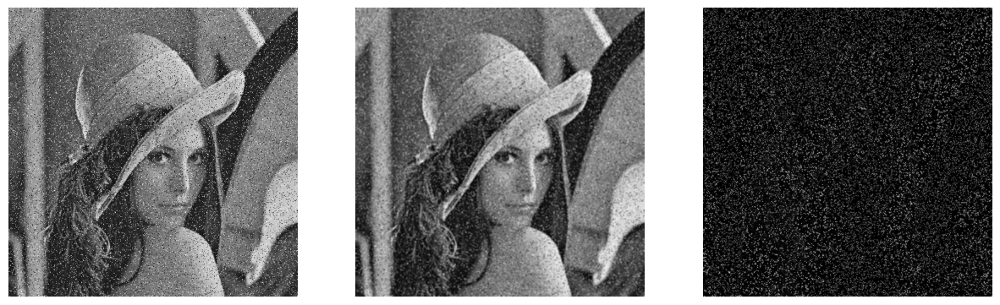

In [25]:
lena_noise = cv2.imread("lenaSzum.png", cv2.IMREAD_GRAYSCALE)
lena_noise_filtered = cv2.filter2D(lena_noise, -1, kernel3)
diff = np.abs(lena_noise.astype(np.int16) - lena_noise_filtered.astype(np.int16)).astype(np.uint8)
imshow_subplt((lena_noise, lena_noise_filtered, diff), 1, 3)

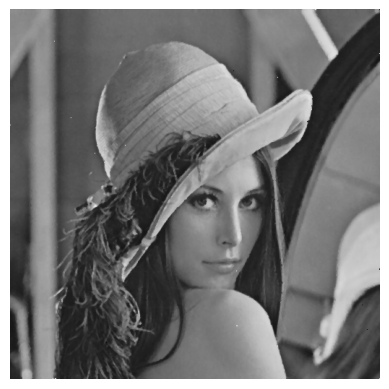

In [26]:
lena_noise_median = cv2.medianBlur(lena_noise, 3)
imshow(lena_noise_median)

2. Przeprowadź filtrację uśredniającą, a następnie medianową obrazu _lena.png_.
   Wyniki porównaj - dla obu wyświetl: oryginał, wynik filtracji i moduł z różnicy.
   Szczególną uwagę zwróć na ostrość i krawędzie.
   W której filtracji krawędzie zostają lepiej zachowane?

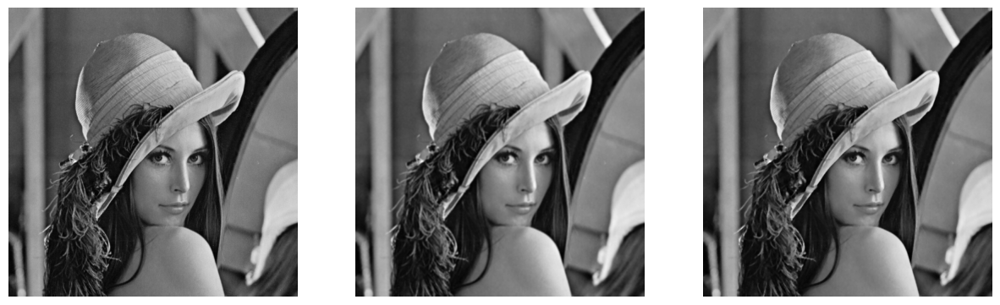

In [27]:
lena_mean = cv2.filter2D(lena, -1, kernel3)
lena_median = cv2.medianBlur(lena, 3)
imshow_subplt((lena, lena_mean, lena_median), 1, 3)

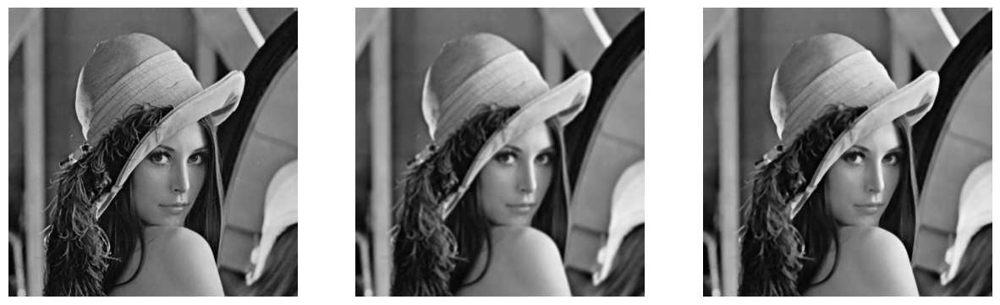

In [28]:
lena_mean = cv2.filter2D(lena, -1, kernel5)
lena_median = cv2.medianBlur(lena, 5)

imshow_subplt((lena, lena_mean, lena_median), 1, 3)

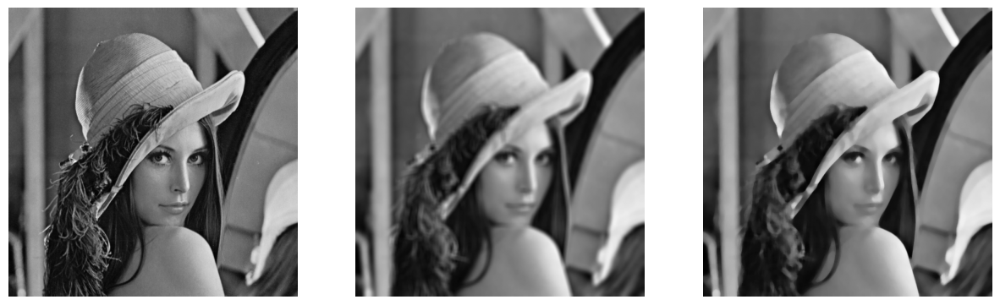

In [29]:
lena_mean = cv2.filter2D(lena, -1, kernel9)
lena_median = cv2.medianBlur(lena, 9)

imshow_subplt((lena, lena_mean, lena_median), 1, 3)

3. Ciekawy efekt można uzyskać wykonując filtrację medianową wielokrotnie. Określa się go mianem  posteryzacji.  W wyniku przetwarzania z obrazka usunięte zostają detale, a duże obszary uzyskują tą samą wartość jasności.  Wykonaj operację mediany $5 \times 5$ na obrazie _lena.png_ 10-krotnie. (wykorzystaj np. pętlę `for`).


Inne filtry nieliniowe:
- filtr modowy - moda (dominanta) zamiast mediany,
- filtr olimpijski - średnia z podzbioru otoczenia (bez wartości ekstremalnych),
- hybrydowy filtr medianowy - mediana obliczana osobno w różnych podzbiorach otoczenia (np. kształt ``x'',``+''), a jako wynik brana jest mediana ze zbioru wartość elementu centralnego, mediana z ``x'' i mediana z ``+'',
- filtr minimalny i maksymalny (będą omówione przy okazji operacji morfologicznych w dalszej części kursu).


Warto zdawać sobie sprawę, z szerokich możliwości dopasowywania rodzaju filtracji do konkretnego rozważanego problemu i rodzaju zaszumienia występującego na obrazie.

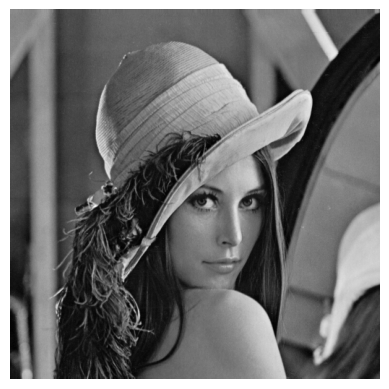

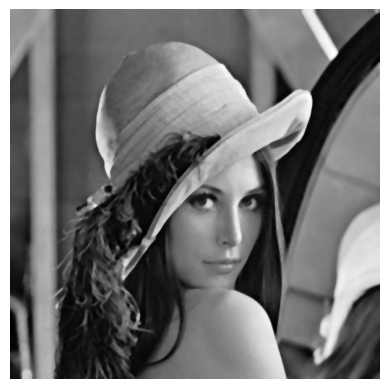

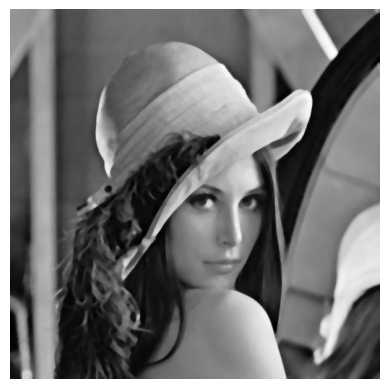

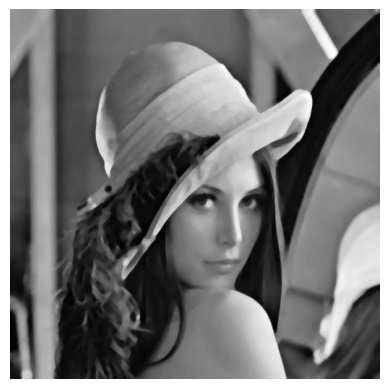

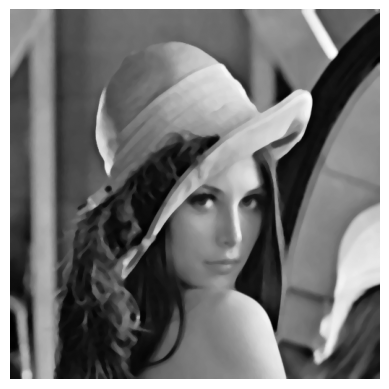

...

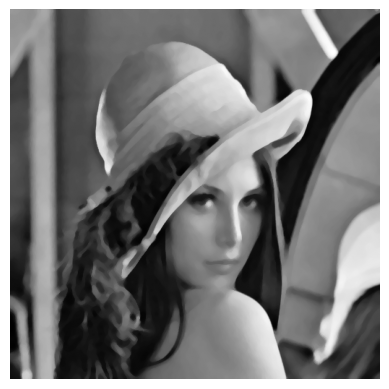

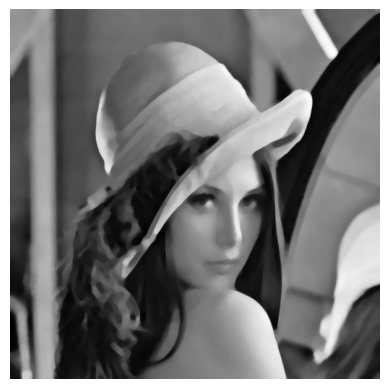

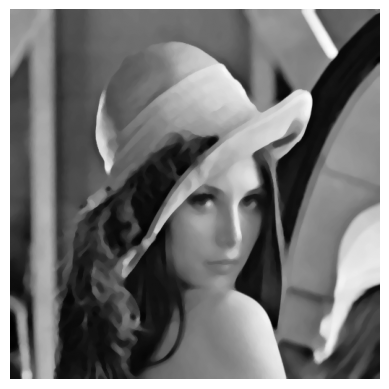

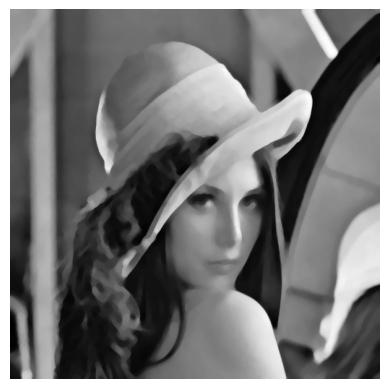

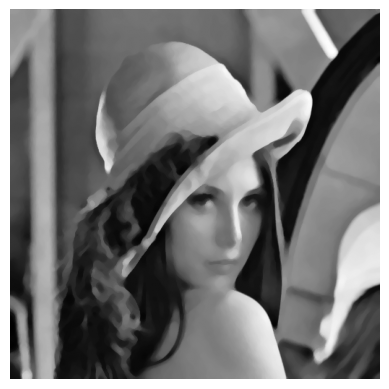

In [30]:
results = [lena]
for _ in range(10):
    next_img = cv2.medianBlur(results[-1], 5)
    results.append(next_img)

for img in results:
    imshow(img)

## Filtry liniowe górnoprzepustowe (wyostrzające, wykrywające krawędzie)

Zadaniem filtrów górnoprzepustowych jest wydobywanie z obrazu składników odpowiedzialnych za szybkie zmiany jasności - konturów, krawędzi, drobnych elementów tekstury.

### Laplasjan (wykorzystanie drugiej pochodnej obrazu)

1. Wczytaj obraz _moon.png_.

2. Wprowadź podstawową maskę laplasjanu:
\begin{equation}
M = 
\begin{bmatrix}
0 & 1& 0 \\ 1 & -4 & 1 \\ 0 & 1 & 0
\end{bmatrix}
\end{equation}

3. Przed rozpoczęciem obliczeń należy dokonać normalizacji maski - dla rozmiaru $3 \times 3$ podzielić każdy element przez 9.
   Proszę zwrócić uwagę, że nie można tu zastosować takiej samej normalizacji, jak dla filtrów dolnoprzepustowanych, gdyż skutkowałby to dzieleniem przez 0.

4. Wykonaj konwolucję obrazu z maską (`c2.filter2D`). Przed wyświetleniem, wynikowy obraz należy poddać normalizacji (występują ujemne wartości). Najczęściej wykonuje się jedną z dwóch operacji:
- skalowanie (np. poprzez dodatnie 128 do każdego z pikseli),
- moduł (wartość bezwzględna).

Wykonaj obie normalizacje. 
Na wspólnym wykresie wyświetl obraz oryginalny oraz przefiltrowany po obu normalizacjach. 

In [31]:
lapl3 = np.ones((3,3))
lapl3[0][0] = lapl3[0][2] = lapl3[2][0] = lapl3[2][2] = 0
lapl3[1][1] = -4
lapl3 = lapl3 / 9
print(lapl3)

[[ 0.          0.11111111  0.        ]
 [ 0.11111111 -0.44444444  0.11111111]
 [ 0.          0.11111111  0.        ]]


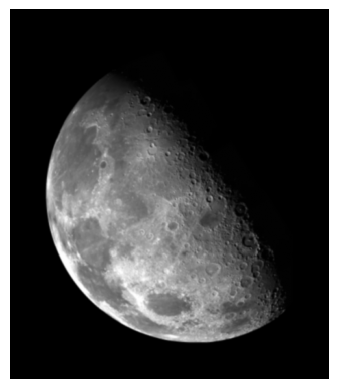

In [32]:
moon = cv2.imread("moon.png", cv2.IMREAD_GRAYSCALE)
imshow(moon)

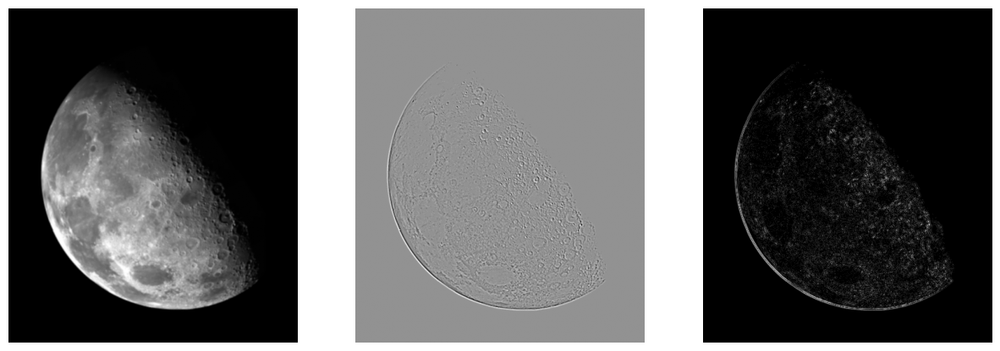

In [33]:
moon_filtered = cv2.filter2D(moon.astype(np.int16), -1, lapl3)
moon_filtered_scale = (moon_filtered + 128)
moon_filtered_abs = np.abs(moon_filtered)
imshow_subplt((moon, moon_filtered_scale, moon_filtered_abs), 1, 3)

7. Efekt wyostrzenia uzyskuje się po odjęciu/dodaniu (zależy do maski) rezultatu filtracji laplasjanowej i oryginalnego obrazu. Wyświetl na jednym wykresie: obraz oryginalny, sumę oryginału i wyniku filtracji oraz różnicę (bezwzględną) oryginału i wyniku filtracji.
 Uwaga. Aby uniknąć artefaktów, należy obraz wejściowy przekonwertować do formatu ze znakiem.



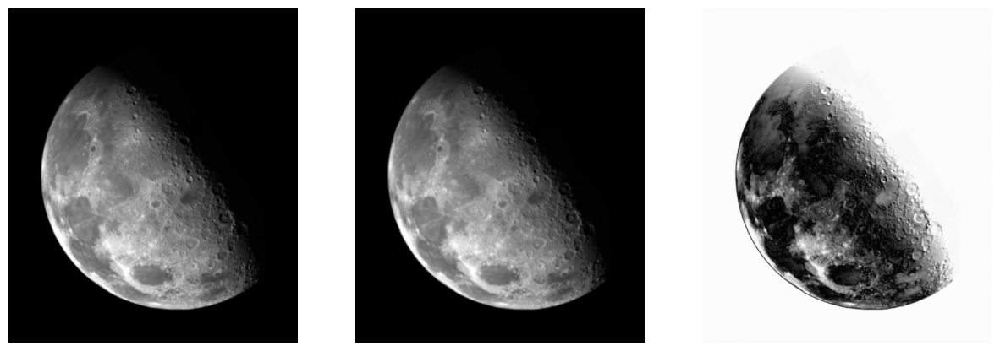

In [34]:
moon_signed = moon.astype(np.int16)
moon_sharp_sum = (moon + moon_filtered_scale)
moon_sharp_diff = np.abs(moon - moon_filtered_scale)
imshow_subplt((moon, moon_sharp_sum, moon_sharp_diff), 1, 3)

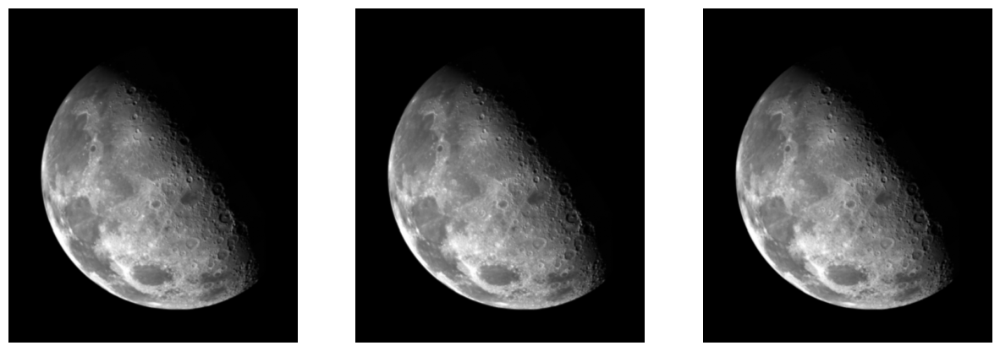

In [35]:
moon_sharp_sum = moon + moon_filtered_abs
moon_sharp_diff = np.abs(moon - moon_filtered_abs)
imshow_subplt((moon, moon_sharp_sum, moon_sharp_diff), 1, 3)

### Gradienty (wykorzystanie pierwszej pochodnej obrazu)

1. Wczytaj obraz _kw.png_. Stwórz odpowiednie maski opisane w kolejnych punktach i dokonaj filtracji.
2. Wykorzystując gradient Robertsa przeprowadź detekcję krawędzi - poprzez wykonanie konwolucji obrazu z daną maską:
\begin{equation}
R1 = \begin{bmatrix} 0 & 0 & 0 \\ -1 & 0 & 0 \\ 0 & 1 & 0 \end{bmatrix}   
R2 = \begin{bmatrix} 0 & 0 & 0 \\ 0 & 0 & -1 \\ 0 & 1 & 0 \end{bmatrix}
\end{equation}

Wykorzystaj stworzony wcześniej kod (przy laplasjanie) - dwie metody normalizacji oraz sposób wyświetlania.

3. Analogicznie przeprowadź detekcję krawędzi za pomocą gradientu Prewitta (pionowy i poziomy)
\begin{equation}
P1 = \begin{bmatrix} -1 & 0 & 1 \\ -1 & 0 & 1 \\ -1 & 0 & 1 \end{bmatrix}   
P2 = \begin{bmatrix} -1 & -1 & -1 \\ 0 & 0 & 0 \\ 1 & 1 & 1 \end{bmatrix}
\end{equation}

4. Podobnie skonstruowany jest gradient Sobela (występuje osiem masek, zaprezentowane są dwie ``prostopadłe''):
\begin{equation}
S1 = \begin{bmatrix} -1 & 0 & 1 \\ -2 & 0 & 2 \\ -1 & 0 & 1 \end{bmatrix}   
S2 = \begin{bmatrix} -1 & -2 & -1 \\ 0 & 0 & 0 \\ 1 & 2 & 1 \end{bmatrix}
\end{equation}

Przeprowadź detekcję krawędzi za pomocą gradientu Sobela. 

In [36]:
R1 = np.array(
    [
        [0, 0, 0],
        [-1, 0, 0],
        [0, 1, 0]
    ]
)

R2 = np.array(
    [
        [0,0,0],
        [0,0,-1],
        [0,1,0]
    ]
)

P1 = np.array(
    [
        [-1,0,1],
        [-1,0,1],
        [-1,0,1]
    ]
)

P2 = np.array(
    [
        [-1,-1,-1],
        [0,0,0],
        [1,1,1]
    ]
)

S1 = np.array(
    [
        [-1,0,1],
        [-2,0,2],
        [-1,0,1]
    ]
)

S2 = np.array(
    [
        [-1,-2,-1],
        [0,0,0],
        [1,2,1],
    ]
)

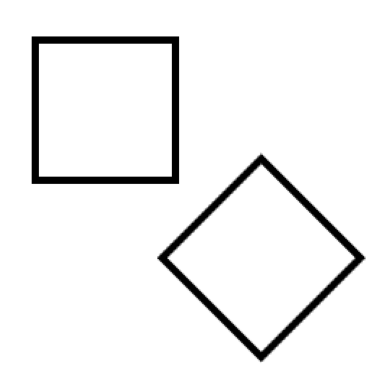

In [37]:
kw = cv2.imread("kw.png", cv2.IMREAD_GRAYSCALE).astype(np.int16)
imshow(kw)

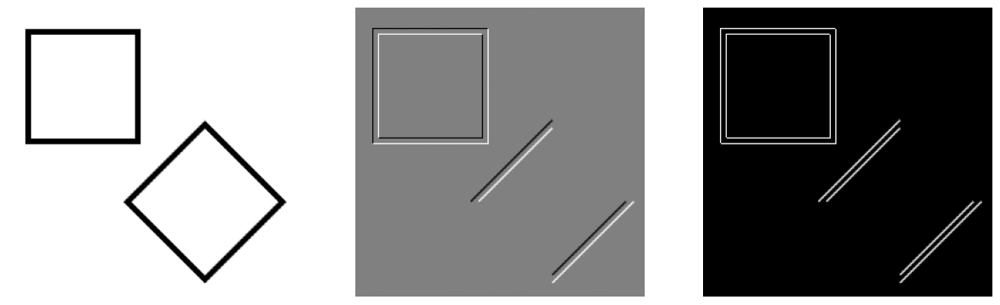

In [38]:
kw_R1 = cv2.filter2D(kw, -1, R1)
kw_R1_scale = kw_R1 + 128
kw_R1_abs = np.abs(kw_R1)
imshow_subplt((kw, kw_R1_scale, kw_R1_abs), 1, 3)

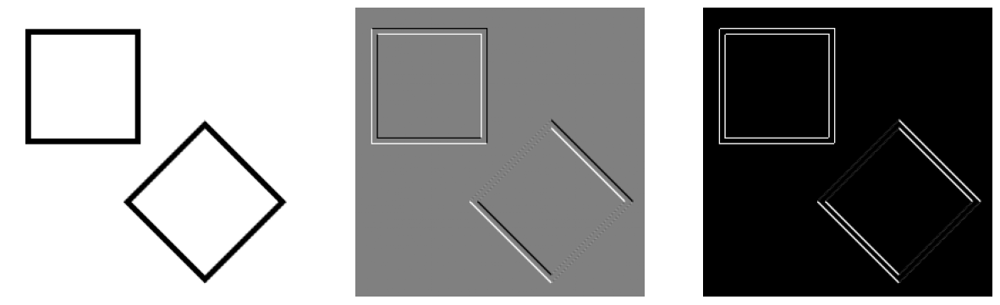

In [39]:
kw_R2 = cv2.filter2D(kw, -1, R2)
kw_R2_scale = kw_R2 + 128
kw_R2_abs = np.abs(kw_R2)
imshow_subplt((kw, kw_R2_scale, kw_R2_abs), 1, 3)

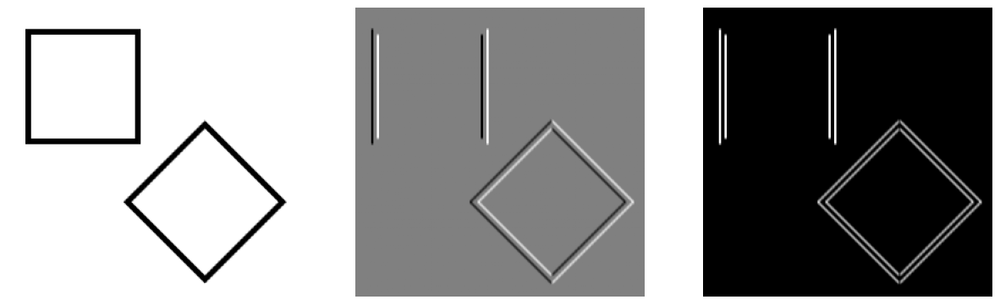

In [40]:
kw_P1 = cv2.filter2D(kw, -1, P1)
kw_P1_scale = kw_P1 + 128
kw_P1_abs = np.abs(kw_P1)
imshow_subplt((kw, kw_P1_scale, kw_P1_abs), 1, 3)

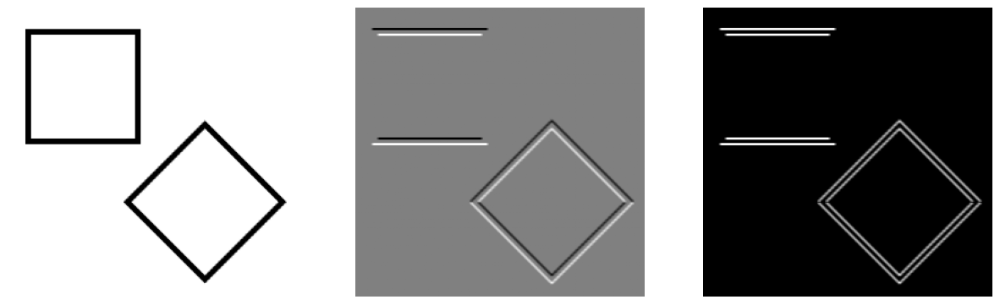

In [41]:
kw_P2 = cv2.filter2D(kw, -1, P2)
kw_P2_scale = kw_P2 + 128
kw_P2_abs = np.abs(kw_P2)
imshow_subplt((kw, kw_P2_scale, kw_P2_abs), 1, 3)

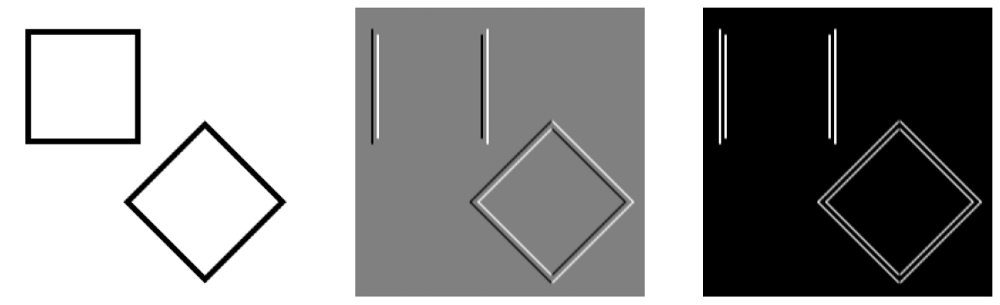

In [42]:
kw_S1 = cv2.filter2D(kw, -1, S1)
kw_S1_scale = kw_S1 + 128
kw_S1_abs = np.abs(kw_S1)
imshow_subplt((kw, kw_S1_scale, kw_S1_abs), 1, 3)

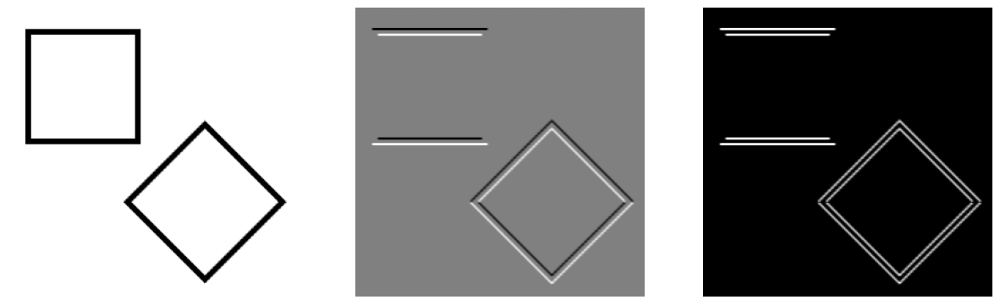

In [43]:
kw_S2 = cv2.filter2D(kw, -1, S2)
kw_S2_scale = kw_S2 + 128
kw_S2_abs = np.abs(kw_S2)
imshow_subplt((kw, kw_S2_scale, kw_S2_abs), 1, 3)

5. Na podstawie dwóch ortogonalnych masek np. Sobela można stworzyć tzw. filtr kombinowany - pierwiastek kwadratowy z sumy kwadratów gradientów:
\begin{equation}
OW = \sqrt{(O * S1)^2 + (O * S2)^2}
\end{equation}
gdzie:  $OW$ - obraz wyjściowy, $O$ - obraz oryginalny (wejściowy), $S1,S2$ - maski Sobela, $*$ - operacja konwolucji.

Zaimplementuj filtr kombinowany.

Uwaga. Proszę zwrócić uwagę na konieczność zmiany formatu danych obrazu wejściowego - na typ znakiem



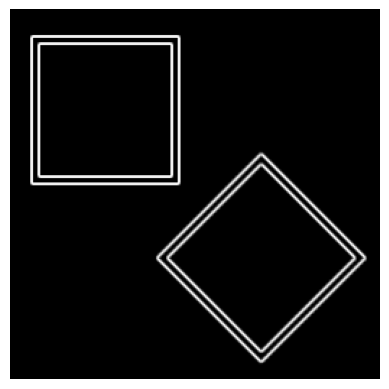

In [44]:
kw = kw.astype(np.int16)
kw_S1 = np.abs(cv2.filter2D(kw, -1, S1)).astype(np.int32)
kw_S2 = np.abs(cv2.filter2D(kw, -1, S2)).astype(np.int32)

kw_res = np.sqrt(np.square(kw_S1) + np.square(kw_S2))
imshow(kw_res)

6. Istnieje alternatywna wersja filtra kombinowanego, która zamiast pierwiastka z sumy kwadratów wykorzystuje sumę modułów (prostsze obliczenia). 
Zaimplementuj tę wersję. 

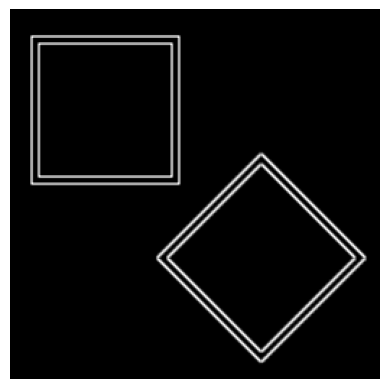

In [45]:
kw = kw.astype(np.int16)
kw_S1 = np.abs(cv2.filter2D(kw, -1, S1))
kw_S2 = np.abs(cv2.filter2D(kw, -1, S2))

kw_res = np.abs(kw_S1) + np.abs(kw_S2)
imshow(kw_res)

7. Wczytaj plik _jet.png_ (zamiast _kw.png_).
Sprawdź działanie obu wariantów filtracji kombinowanej.

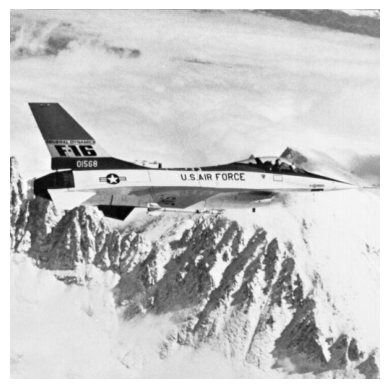

In [46]:
jet = cv2.imread("jet.png", cv2.IMREAD_GRAYSCALE)
imshow(jet)

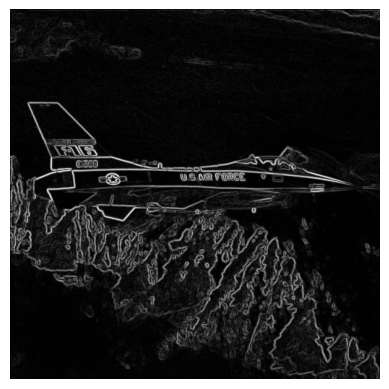

In [47]:
jet = jet.astype(np.int16)
jet_S1 = np.abs(cv2.filter2D(jet, -1, S1)).astype(np.int32)
jet_S2 = np.abs(cv2.filter2D(jet, -1, S2)).astype(np.int32)

jet_res = np.sqrt(np.square(jet_S1) + np.square(jet_S2))
imshow(jet_res)

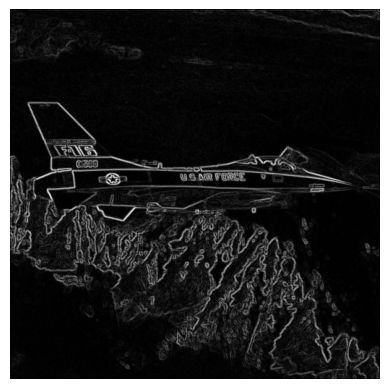

In [48]:
jet = jet.astype(np.int16)
jet_S1 = np.abs(cv2.filter2D(jet, -1, S1))
jet_S2 = np.abs(cv2.filter2D(jet, -1, S2))

jet_res = np.abs(jet_S1) + np.abs(jet_S2)
imshow(jet_res)